In [2]:
import IPython.display as ipd
import librosa 
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

In [3]:
firework_file_path = './audios/05_-_firework.mp3'
azerbayjani_file_path = './audios/Şövkət-Ələkbərova-Getmə.mp3'

In [4]:
ipd.Audio(firework_file_path)

In [5]:
ipd.Audio(azerbayjani_file_path)

In [6]:
firework, firework_sr = librosa.load(firework_file_path)
#firework, firework_sr = librosa.load(firework_file_path, duration= 30)
azerbayjani, azerbayjani_sr = librosa.load(azerbayjani_file_path)

In [7]:
print(firework.size)
print(azerbayjani.size)

5032398
6218752


In [8]:
firework_sample_duration = 1/firework_sr
azerbayjani_sample_duration = 1/azerbayjani_sr

print(f'duration of each sample in firework music is {firework_sample_duration:.6f} seconds')
print(f'duration of each sample in azerbayjani music is {azerbayjani_sample_duration:.6f} seconds')

duration of each sample in firework music is 0.000045 seconds
duration of each sample in azerbayjani music is 0.000045 seconds


In [9]:
firework_duration = 1/firework_sr * firework.size
azerbayjani_duration = 1/azerbayjani_sr * azerbayjani.size

print(f'the duration of firework music is {firework_duration} seconds')
print(f'the duration of azerbayjani music is {azerbayjani_duration} seconds')

the duration of firework music is 228.22666666666666 seconds
the duration of azerbayjani music is 282.0295691609977 seconds


(-1.0, 1.0)

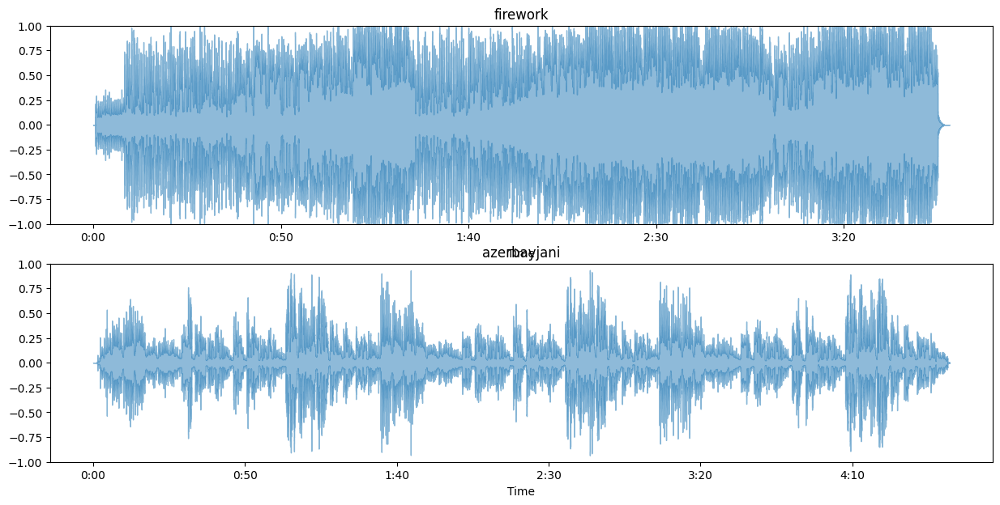

In [10]:
# plotting time domain

plt.figure(figsize= (15, 7))

plt.subplot(2, 1, 1)
librosa.display.waveshow(firework, alpha = .5)
plt.title('firework')
plt.ylim(-1, 1)

plt.subplot(2, 1, 2)
librosa.display.waveshow(azerbayjani, alpha=.5)
plt.title('azerbayjani')
plt.ylim(-1, 1)

In [11]:
# amplitude envelope function

frame_size = 1024
hop_length = 512

def amplitude_envelope(signal, frame_size, hop_length):
    envelpes = []
    for i in range(0, len(signal), hop_length):
        envelpes.append(max(signal[i: i + frame_size]))
    return np.array(envelpes)

In [12]:
ae_firework = amplitude_envelope(firework, frame_size, hop_length)
ae_azerbayjani = amplitude_envelope(azerbayjani, frame_size, hop_length)

In [13]:
ae_firework.size

9829

(-1.0, 1.0)

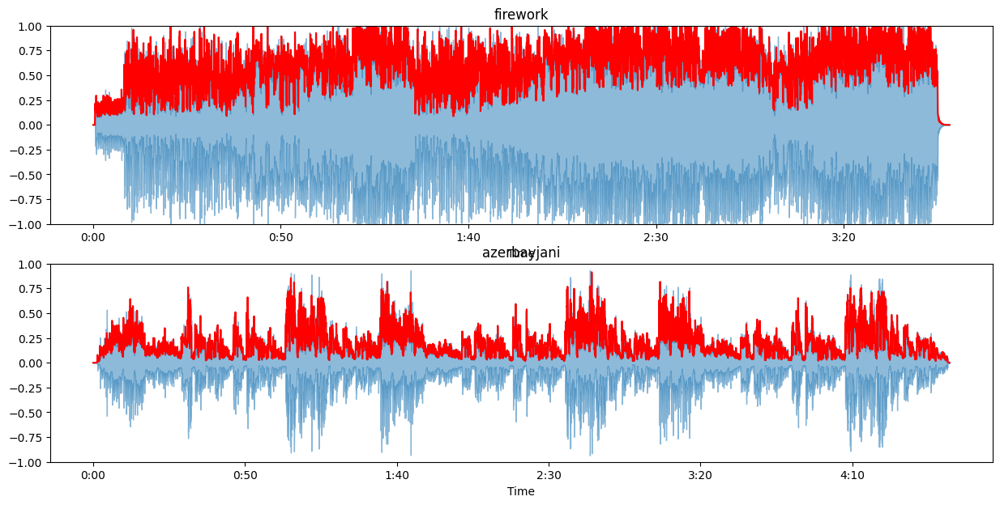

In [15]:
# plotting amplitude envelope

firework_frames = range(0, ae_firework.size)
azerbayjani_frames = range(0, ae_azerbayjani.size)
firework_t = librosa.frames_to_time(firework_frames, hop_length= hop_length)
azerbayjani_t = librosa.frames_to_time(azerbayjani_frames, hop_length= hop_length)

plt.figure(figsize=(15, 7))

plt.subplot(2, 1, 1)
librosa.display.waveshow(firework, alpha=.5)
plt.plot(firework_t, ae_firework, color = 'r')
plt.title('firework')
plt.ylim(-1, 1)

plt.subplot(2, 1, 2)
librosa.display.waveshow(azerbayjani, alpha=.5)
plt.plot(azerbayjani_t, ae_azerbayjani, color='r')
plt.title('azerbayjani')
plt.ylim(-1, 1)

In [18]:
# extract rmse(root mean square energy) with librosa function
rms_firework = librosa.feature.rms(y = firework, frame_length= frame_size, hop_length= hop_length)
rms_azerbayjani = librosa.feature.rms(y = azerbayjani, frame_length= frame_size, hop_length= hop_length)

(-1.0, 1.0)

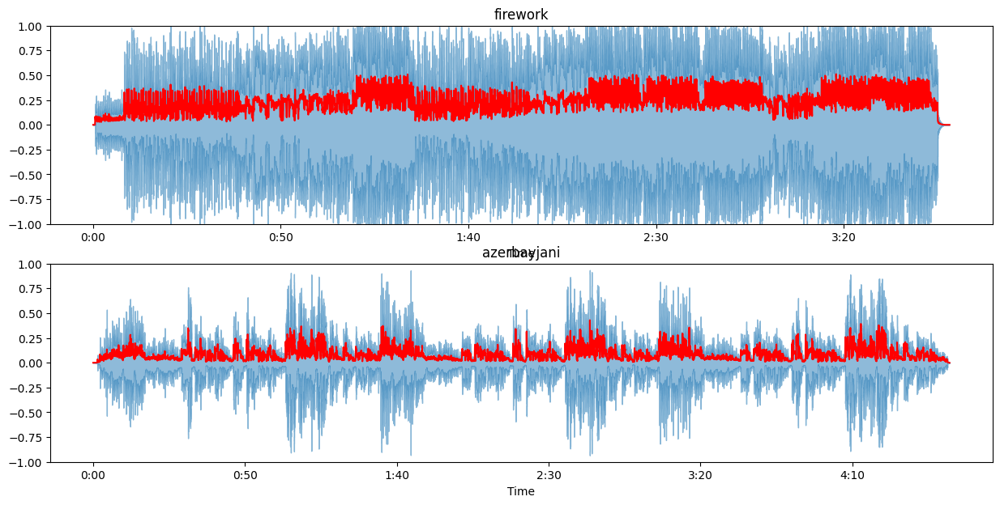

In [22]:
# plotting rsme
firework_frames = range(0, rms_firework.size)
azerbayjani_frames = range(0, rms_azerbayjani.size)
firework_t = librosa.frames_to_time(firework_frames, hop_length=hop_length)
azerbayjani_t = librosa.frames_to_time(
    azerbayjani_frames, hop_length=hop_length)

plt.figure(figsize=(15, 7))

plt.subplot(2, 1, 1)
librosa.display.waveshow(firework, alpha=.5)
plt.plot(firework_t, rms_firework[0], color='r')
plt.title('firework')
plt.ylim(-1, 1)

plt.subplot(2, 1, 2)
librosa.display.waveshow(azerbayjani, alpha=.5)
plt.plot(azerbayjani_t, rms_azerbayjani[0], color='r')
plt.title('azerbayjani')
plt.ylim(-1, 1)

In [38]:
# extract rmse(root mean square energy) with defining function
def rmse(signal, frame_length, hop_length):
    rmses = []
    for i in range(0, len(signal), hop_length):
        rmses.append(np.sqrt(np.sum(np.square(signal[i: i + hop_length]))/frame_length))
    return np.array(rmses)
 

In [39]:
rmse_firework = rmse(firework, frame_size, hop_length)
rmse_azerbayjani = rmse(azerbayjani, frame_size, hop_length)

(-1.0, 1.0)

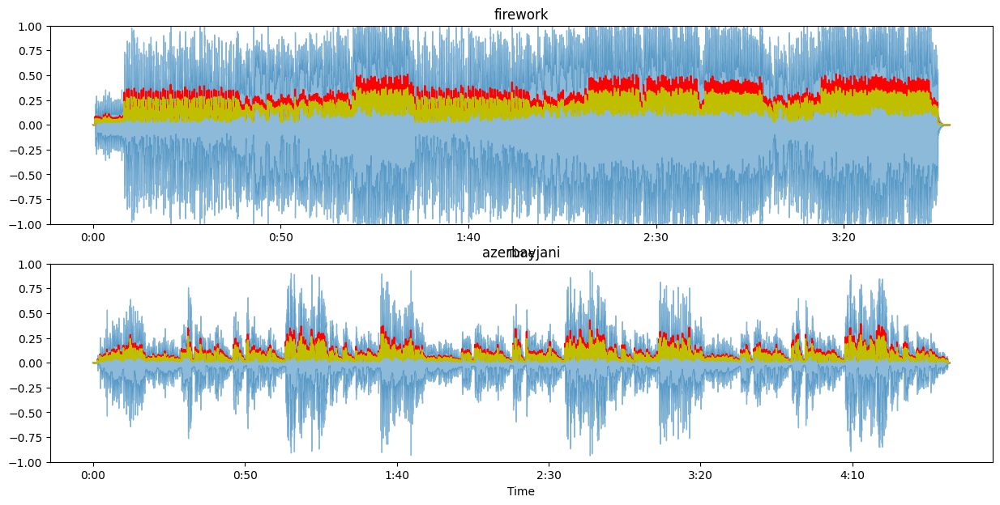

In [40]:
# plotting rmse
firework_frames = range(0, rms_firework.size)
azerbayjani_frames = range(0, rms_azerbayjani.size)
azerbayjani_frames1 = range(0, rmse_azerbayjani.size)
firework_t = librosa.frames_to_time(firework_frames, hop_length=hop_length)
azerbayjani_t = librosa.frames_to_time(
    azerbayjani_frames, hop_length=hop_length)
azerbayjani_t1 = librosa.frames_to_time(azerbayjani_frames1, hop_length= hop_length)
plt.figure(figsize=(15, 7))

plt.subplot(2, 1, 1)
librosa.display.waveshow(firework, alpha=.5)
plt.plot(firework_t, rms_firework[0], color='r')
plt.plot(firework_t, rmse_firework, color='y')
plt.title('firework')
plt.ylim(-1, 1)

plt.subplot(2, 1, 2)
librosa.display.waveshow(azerbayjani, alpha=.5)
plt.plot(azerbayjani_t, rms_azerbayjani[0], color='r')
plt.plot(azerbayjani_t1, rmse_azerbayjani, color='y')
plt.title('azerbayjani')
plt.ylim(-1, 1)

In [44]:
# extract zcr(zero crossing ) with librosa function
zcr_firework = librosa.feature.zero_crossing_rate(
    y=firework, frame_length=frame_size, hop_length=hop_length
)
zcr_azerbayjani = librosa.feature.zero_crossing_rate(
    y=azerbayjani, frame_length=frame_size, hop_length=hop_length
)


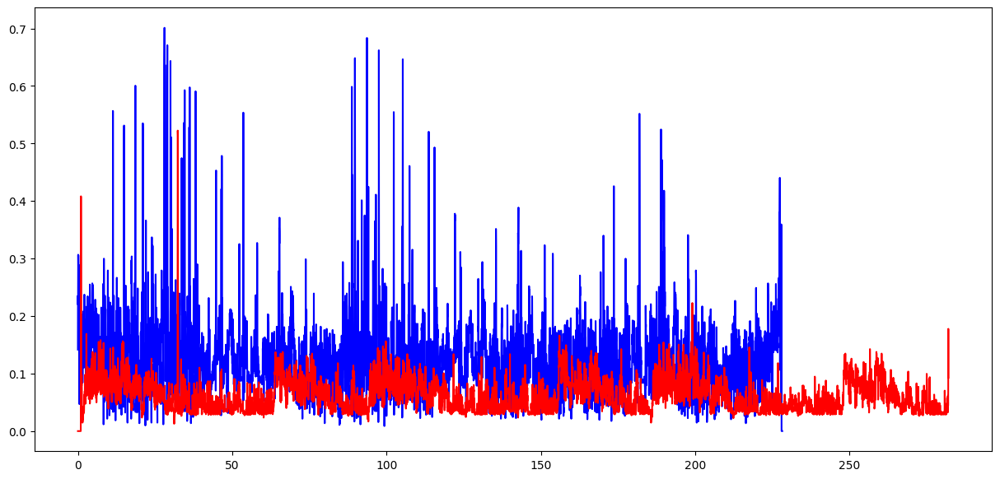

In [47]:
# plotting rme
# the value is normalized with frame length, for example if zero crossing is 700 and frame size is 1000 the value will be .7
firework_frames = range(0, zcr_firework.size)
azerbayjani_frames = range(0, zcr_azerbayjani.size)
firework_t = librosa.frames_to_time(firework_frames, hop_length=hop_length)
azerbayjani_t = librosa.frames_to_time(
    azerbayjani_frames, hop_length=hop_length)

plt.figure(figsize=(15, 7))
plt.plot(firework_t, zcr_firework[0], 'b')
plt.plot(azerbayjani_t, zcr_azerbayjani[0], 'r')